<a id="toc"></a>
<p style="font-family:verdana; font-size:40px;"><center>Alzheimers Image Classification with Convolutional Neural Networks</center></p>
<hr>

<center><img src='https://media1.giphy.com/media/v1.Y2lkPTc5MGI3NjExaDh3ZG1hNHZjc3BwbmRtdmlrZmZveHY5Y2tybGxoazBqajVucHZjNiZlcD12MV9pbnRlcm5hbF9naWZfYnlfaWQmY3Q9Zw/10t0Rjkv7wEAAo/giphy.webp' height=200px width=400px></center>

In [ ]:
!pip install tensorflow-gpu==2.10.0

# Import Libraries

In [ ]:
# Import Data Science Libraries
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
import itertools
import random

# Import visualization libraries
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2
import seaborn as sns

# Tensorflow Libraries
from tensorflow import keras
from tensorflow.keras import layers,models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import Callback, EarlyStopping,ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import Model
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.optimizers import Adam

# System libraries
from pathlib import Path
import os.path

# Metrics
from sklearn.metrics import classification_report, confusion_matrix

sns.set_style('darkgrid')

In [ ]:
def seed_everything(seed=42):
    # Seed value for TensorFlow
    tf.random.set_seed(seed)
    # Seed value for NumPy
    np.random.seed(seed)
    # Seed value for Python's random library
    random.seed(seed)

    # In TensorFlow 2.x you no longer need to manually manage sessions.
    # The following lines are removed as they are not needed in TF 2.x and cause errors.
    session_conf = tf.compat.v1.ConfigProto(
        intra_op_parallelism_threads=1,
        inter_op_parallelism_threads=1
    )

    tf.compat.v1.set_random_seed(seed)
    sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
    tf.compat.v1.keras.backend.set_session(sess)

seed_everything()

# Create helper functions

In [ ]:
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py

# Import series of helper functions for our notebook
from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, compare_historys, walk_through_dir, pred_and_plot

--2024-09-23 03:10:11--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2024-09-23 03:10:11 (128 MB/s) - ‘helper_functions.py’ saved [10246/10246]



In [ ]:
!pip install git+https://github.com/paulgavrikov/visualkeras

  Cloning https://github.com/paulgavrikov/visualkeras to /tmp/pip-req-build-k9qtvqow
  Running command git clone --filter=blob:none --quiet https://github.com/paulgavrikov/visualkeras /tmp/pip-req-build-k9qtvqow
  Resolved https://github.com/paulgavrikov/visualkeras to commit 3cb339c3fbd7e96f9764a4c1d0966fd403510f3b
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.7/993.7 kB 4.7 MB/s eta 0:00:00
  Created wheel for visualkeras: filename=visualkeras-0.1.3-py3-none-any.whl size=16304 sha256=28022917732ad112438ac8fe485d686f92ad516606937344e6b1c2431b0c5f7b
  Stored in directory: /tmp/pip-ephem-wheel-cache-6zod8j73/wheels/89/d3/c2/937382b33c09192fc84331bbc02c4565d62aeae67e9684c37e
Successfully built visualkeras


# Load and Transform Data

In [ ]:
!pip install kaggle
!pip install opendatasets
!pip install pandas

⤵️ Import dataset from Kaggle

In [ ]:
# upload and read API token from Kaggle
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
import opendatasets as od
import pandas as pd

# Ensure the correct Kaggle credentials are set up
!kaggle config set -n username -v <YOUR_KAGGLE_USERNAME>
!kaggle config set -n key -v <YOUR_KAGGLE_API_KEY>

# Try downloading the dataset again
od.download("https://www.kaggle.com/datasets/tourist55/alzheimers-dataset-4-class-of-images")

/bin/bash: -c: line 1: syntax error near unexpected token `newline'
/bin/bash: -c: line 1: `kaggle config set -n username -v <YOUR_KAGGLE_USERNAME>'
/bin/bash: -c: line 1: syntax error near unexpected token `newline'
/bin/bash: -c: line 1: `kaggle config set -n key -v <YOUR_KAGGLE_API_KEY>'
Dataset URL: https://www.kaggle.com/datasets/tourist55/alzheimers-dataset-4-class-of-images


100%|██████████| 34.1M/34.1M [00:00<00:00, 184MB/s]

⤵️ Checking the directory structure of the dataset

In [ ]:
# Walk through each directory
dataset ="/content/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset"
walk_through_dir(dataset)

There are 2 directories and 0 images in '/content/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset'.
There are 4 directories and 0 images in '/content/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/train'.
There are 0 directories and 52 images in '/content/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/train/ModerateDemented'.
There are 0 directories and 717 images in '/content/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/train/MildDemented'.
There are 0 directories and 2560 images in '/content/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/train/NonDemented'.
There are 0 directories and 1792 images in '/content/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/train/VeryMildDemented'.
There are 4 directories and 0 images in '/content/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/test'.
There are 0 directories and 12 images in '/content/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/test/ModerateDemented'.
Th

⤵️ Visualization of dataset distribution

In [ ]:
def convert_path_to_df(dataset):
    image_dir = Path(dataset)

    # Get filepaths and labels
    filepaths = list(image_dir.glob(r'**/*.JPG')) + list(image_dir.glob(r'**/*.jpg')) + list(image_dir.glob(r'**/*.jpeg')) + list(image_dir.glob(r'**/*.PNG'))

    labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

    filepaths = pd.Series(filepaths, name='Filepath').astype(str)
    labels = pd.Series(labels, name='Label')

    # Concatenate filepaths and labels
    image_df = pd.concat([filepaths, labels], axis=1)
    return image_df

image_df = convert_path_to_df(dataset)

<ipython-input-15-f90a9469a260>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label_counts.index, y=label_counts.values, alpha=0.8, palette='pastel', ax=axes)
<ipython-input-15-f90a9469a260>:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes.set_xticklabels(label_counts.index, rotation=45)


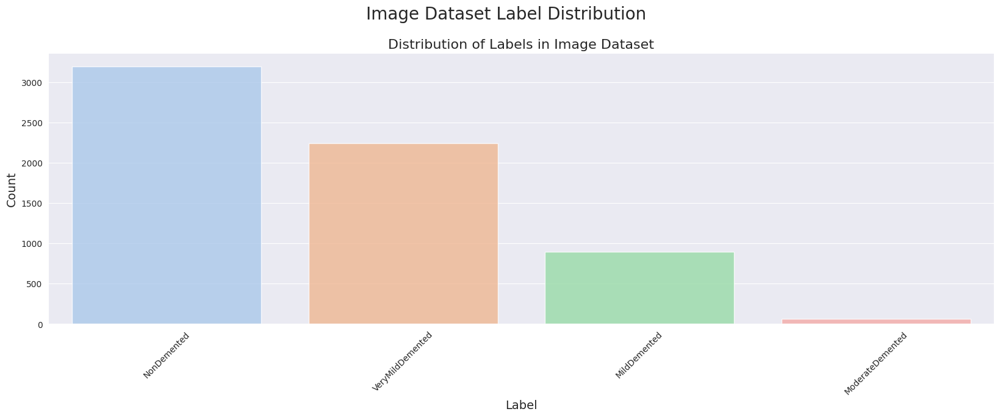

In [ ]:
# Get the value counts for each label
label_counts = image_df['Label'].value_counts()

# Create the figure and axes
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 6))

# Plot the bar chart
sns.barplot(x=label_counts.index, y=label_counts.values, alpha=0.8, palette='pastel', ax=axes)
axes.set_title('Distribution of Labels in Image Dataset', fontsize=16)
axes.set_xlabel('Label', fontsize=14)
axes.set_ylabel('Count', fontsize=14)
axes.set_xticklabels(label_counts.index, rotation=45)

# Add a super-title to the figure
fig.suptitle('Image Dataset Label Distribution', fontsize=20)

# Adjust the spacing between the plots and the title
fig.subplots_adjust(top=0.85)

# Display the plot
plt.show()

↘️ The graph shows very unbalanced daatset

# Visualizing images from the dataset

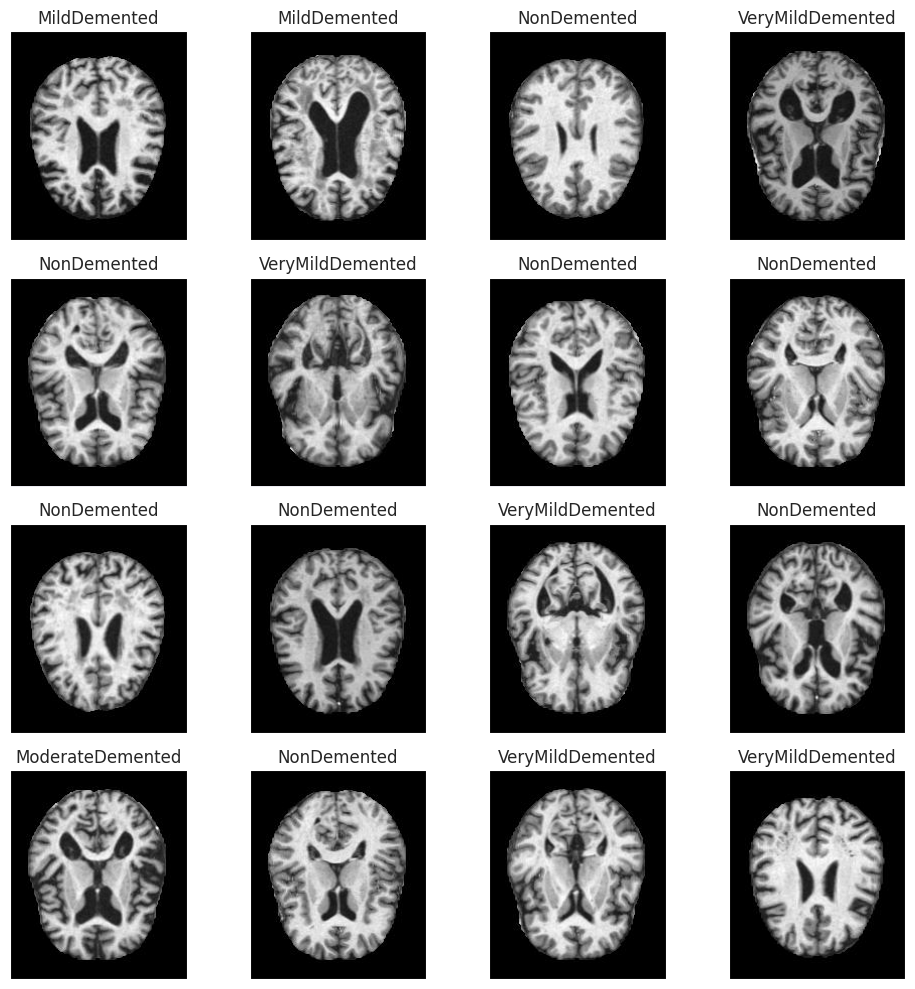

In [ ]:
random_index = np.random.randint(0, len(image_df), 16)
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    image = plt.imread(image_df.Filepath[random_index[i]])
    ax.imshow(image, cmap='gray')  # Use 'gray' colormap for grayscale
    ax.set_title(image_df.Label[random_index[i]])

plt.tight_layout()
plt.show()

# Computing Error Rate Analysis

⤵️ Visualisation of JPEG compression using Error Level Analysis (ELA)

to View the quality of the compressed image

In [ ]:
def compute_ela_cv(path, quality):
    temp_filename = 'temp_file_name.jpeg'
    SCALE = 15
    orig_img = cv2.imread(path)
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

    cv2.imwrite(temp_filename, orig_img, [cv2.IMWRITE_JPEG_QUALITY, quality])
    # read compressed image
    compressed_img = cv2.imread(temp_filename)
    # get absolute difference between img1 and img2 and multiply by scale
    diff = SCALE * cv2.absdiff(orig_img, compressed_img)
    return diff

def convert_to_ela_image(path, quality):
    temp_filename = 'temp_file_name.jpeg'
    ela_filename = 'temp_ela.png'
    image = Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPEG', quality = quality)
    temp_image = Image.open(temp_filename)

    ela_image = ImageChops.difference(image, temp_image)

    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1
    scale = 255.0 / max_diff
    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)
    return ela_image


def random_sample(path, extension=None):
    if extension:
        items = Path(path).glob(f'*.{extension}')
    else:
        items = Path(path).glob(f'*')
    items = list(items)
    p = random.choice(items)
    return p.as_posix()

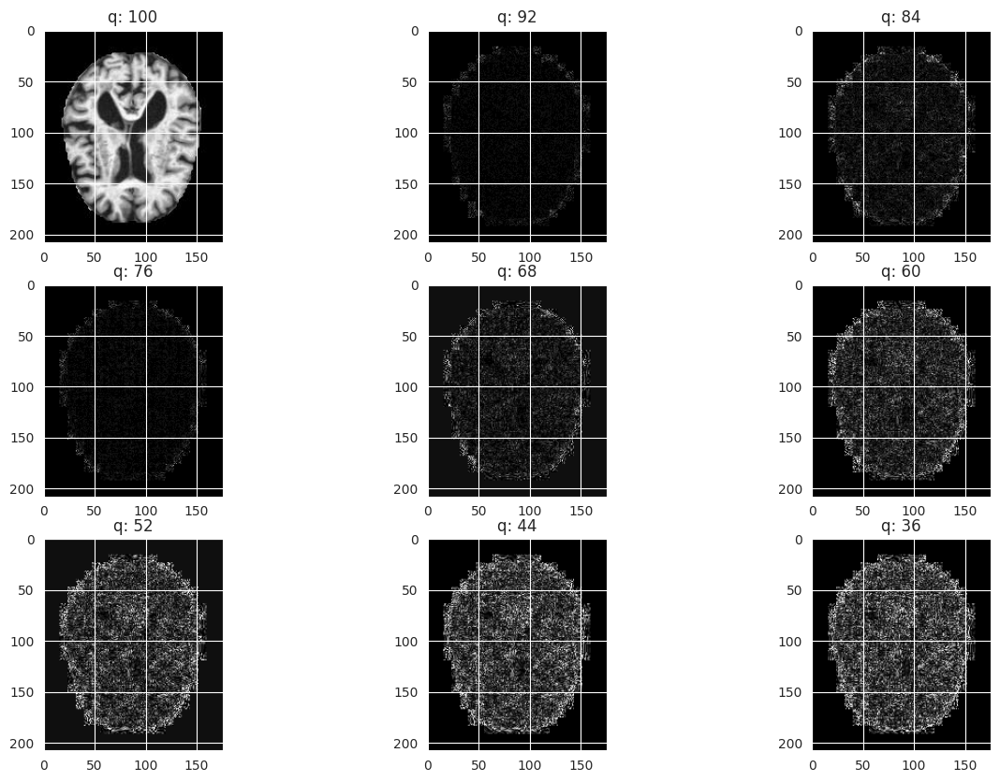

In [ ]:
# View random sample from the dataset
p = random_sample('/content/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset/train/VeryMildDemented')
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality=init_val - (i-1) * 8
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i)
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()

# Data Preprocessing

In [ ]:
import os
from pathlib import Path
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# Define directories
dataset = "/content/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset"

# Function to convert image paths to DataFrame
def convert_path_to_df(dataset):
    image_dir = Path(dataset)

    # Get filepaths and labels
    filepaths = list(image_dir.glob(r'**/*.JPG')) + list(image_dir.glob(r'**/*.jpg')) + list(image_dir.glob(r'**/*.jpeg')) + list(image_dir.glob(r'**/*.PNG'))
    labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

    filepaths = pd.Series(filepaths, name='Filepath').astype(str)
    labels = pd.Series(labels, name='Label')

    # Concatenate filepaths and labels
    image_df = pd.concat([filepaths, labels], axis=1)
    return image_df

# Convert paths to DataFrame
image_df = convert_path_to_df(dataset)

⤵️ Define data train and test

In [ ]:
# Separate in train and test data
train_df, test_df = train_test_split(image_df, test_size=0.2, shuffle=True, random_state=42)

⤵️ Normalization and Data split
* rescale = 1/255 to set pixel range [0, 1]
* split 10% images of data train for data validation

In [ ]:
# Define ImageDataGenerator for training and testing
train_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
    rescale=1/255,
    validation_split=0.1  # Adjusted to use 10% of training data for validation
)

test_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
    rescale=1/255
)

⤵️ Data preparation in batch
* 128 image/batch

In [ ]:
# Define constants
BATCH_SIZE = 128
TARGET_SIZE = (224, 224)

# Create data generators
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    subset='training'
)

val_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    subset='validation'
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 4608 validated image filenames belonging to 4 classes.
Found 512 validated image filenames belonging to 4 classes.
Found 1280 validated image filenames belonging to 4 classes.


# Modelling

⤵️ Model Training & Optimization

**1. Hyperparameter** (model tuning)
* Optimizer: Adam
* Learning Rate: 1e-3 (default)
* Input Size: 224 x 224
* Batch Size: 128
* Dropout: 0.45
* Early Stopping Patience: 3
* Epoch: 10

* Scheduled Learning Rate: 1e-4
* patience: 3
* Factor: 0.2

**2. Metrics** (evaluate model performance)
* accuracy
* precision
* recall
* f1-score
* support

**3. Loss Function** (measures predicted probabilities match the actual labels)
* categorical crossentropy

## CNN From Scratch




In [ ]:
# Create the model
model = Sequential([
    Conv2D(10, 3, activation='relu', input_shape=(224, 224, 3)),
    Conv2D(10, 3, activation='relu'),
    MaxPool2D(),
    Conv2D(10, 3, activation='relu'),
    Conv2D(10, 3, activation='relu'),
    MaxPool2D(),
    Flatten(),
    Dense(4, activation='softmax')  # Adjusted to 4 classes
])

# Compile the model
model.compile(
    loss="categorical_crossentropy",
    optimizer=tf.keras.optimizers.Adam(),
    metrics=["accuracy"]
)

# Setup EarlyStopping callback
early_stopping = EarlyStopping(
    monitor="val_loss",              # Watch the validation loss
    patience=3,                      # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True        # Restore the weights of the best epoch
)

# Fit the model
history = model.fit(
    train_images,
    epochs=10,
    batch_size=BATCH_SIZE,
    validation_data=val_images,
    steps_per_epoch=len(train_images),
    validation_steps=len(val_images),
    callbacks=[early_stopping]  # Include the EarlyStopping callback
)

Epoch 1/10
36/36 [==============================] - 224s 6s/step - loss: 1.0343 - accuracy: 0.5078 - val_loss: 0.9324 - val_accuracy: 0.5938
Epoch 2/10
36/36 [==============================] - 224s 6s/step - loss: 0.8739 - accuracy: 0.6074 - val_loss: 0.7627 - val_accuracy: 0.6895
Epoch 3/10
36/36 [==============================] - 209s 6s/step - loss: 0.6726 - accuracy: 0.7179 - val_loss: 0.6098 - val_accuracy: 0.7422
Epoch 4/10
36/36 [==============================] - 209s 6s/step - loss: 0.5026 - accuracy: 0.7949 - val_loss: 0.5054 - val_accuracy: 0.7734
Epoch 5/10
36/36 [==============================] - 209s 6s/step - loss: 0.3075 - accuracy: 0.8900 - val_loss: 0.3179 - val_accuracy: 0.8555
Epoch 6/10
36/36 [==============================] - 211s 6s/step - loss: 0.2058 - accuracy: 0.9212 - val_loss: 0.2165 - val_accuracy: 0.9141
Epoch 7/10
36/36 [==============================] - 212s 6s/step - loss: 0.1134 - accuracy: 0.9646 - val_loss: 0.1395 - val_accuracy: 0.9453
Epoch 8/10
36

In [ ]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.21043
Test Accuracy: 93.20%


In [ ]:
# prompt: save model to drive

model.save('/content/drive/MyDrive/A SAVED MODEL/cnn_from_scratch')

In [ ]:
# Load model
# model = keras.models.load_model('/content/drive/MyDrive/A SAVED MODEL/cnn_from_scratch', compile=False)

# Call compile with the appropriate loss function and metrics
# model.compile(loss='categorical_crossentropy', metrics=['accuracy'])

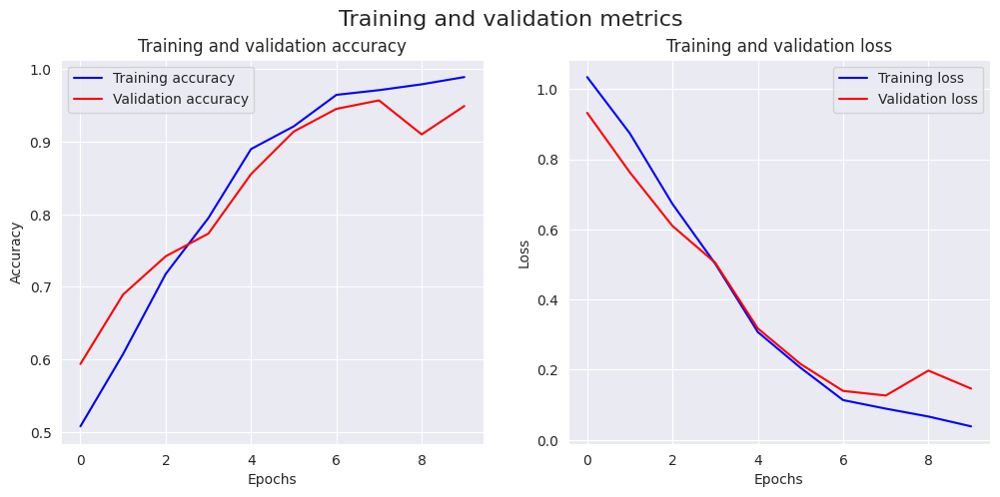

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

ax1.plot(epochs, accuracy, 'b', label='Training accuracy')
ax1.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
ax1.set_title('Training and validation accuracy')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.legend()

ax2.plot(epochs, loss, 'b', label='Training loss')
ax2.plot(epochs, val_loss, 'r', label='Validation loss')
ax2.set_title('Training and validation loss')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.legend()

fig.suptitle('Training and validation metrics', fontsize=16)
plt.show()

In [ ]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
#print(f'The first 5 predictions: {pred[:5]}')

10/10 [==============================] - 26s 3s/step


In [ ]:
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                  precision    recall  f1-score   support

    MildDemented       0.96      0.97      0.97       194
ModerateDemented       1.00      1.00      1.00        20
     NonDemented       0.89      0.99      0.94       643
VeryMildDemented       0.99      0.82      0.90       423

        accuracy                           0.93      1280
       macro avg       0.96      0.95      0.95      1280
    weighted avg       0.94      0.93      0.93      1280



In [ ]:
report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

,precision,recall,f1-score,support
MildDemented,0.959391,0.974227,0.966752,194.000000
ModerateDemented,1.000000,1.000000,1.000000,20.000000
NonDemented,0.894811,0.992224,0.941003,643.000000
VeryMildDemented,0.988571,0.817967,0.895213,423.000000
accuracy,0.932031,0.932031,0.932031,0.932031
macro avg,0.960693,0.946104,0.950742,1280.000000
weighted avg,0.937227,0.932031,0.930695,1280.000000


↘️ Make prediction from test dataset

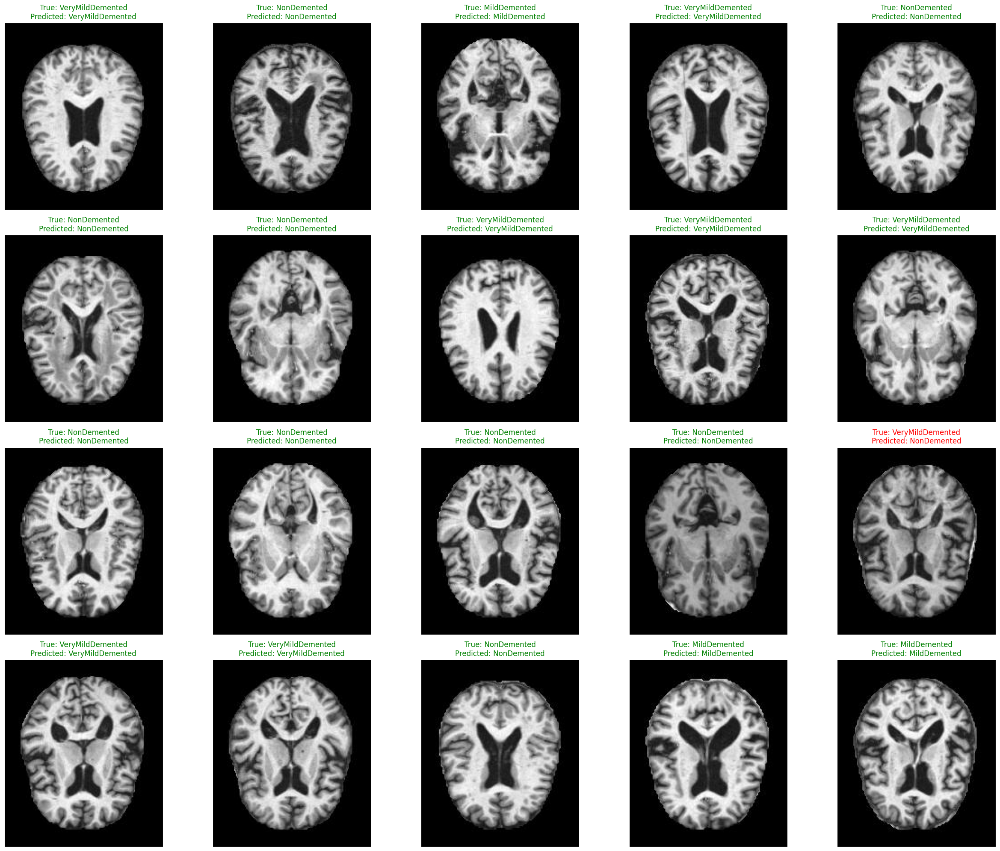

In [ ]:
# Display 20 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 20)
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(25, 20),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    # Read the image and convert to grayscale
    img = plt.imread(test_df.Filepath.iloc[random_index[i]])
    ax.imshow(img, cmap='gray')  # Display image in grayscale

    # Set title color based on whether prediction was correct
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
        color = "green"
    else:
        color = "red"

    # Display the true and predicted labels
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)

plt.tight_layout()
plt.show()

↘️ Grad-CAM Visualization

In [ ]:
def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size "size"
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]
    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)
    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
#     display(Image(cam_path))

    return cam_path


preprocess_input = tf.keras.applications.efficientnet.preprocess_input
decode_predictions = tf.keras.applications.efficientnet.decode_predictions

last_conv_layer_name = "top_conv"
img_size = (224,224, 3)

# Remove last layer's softmax
model.layers[-1].activation = None

<ipython-input-27-7d0c4574ec1c>:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


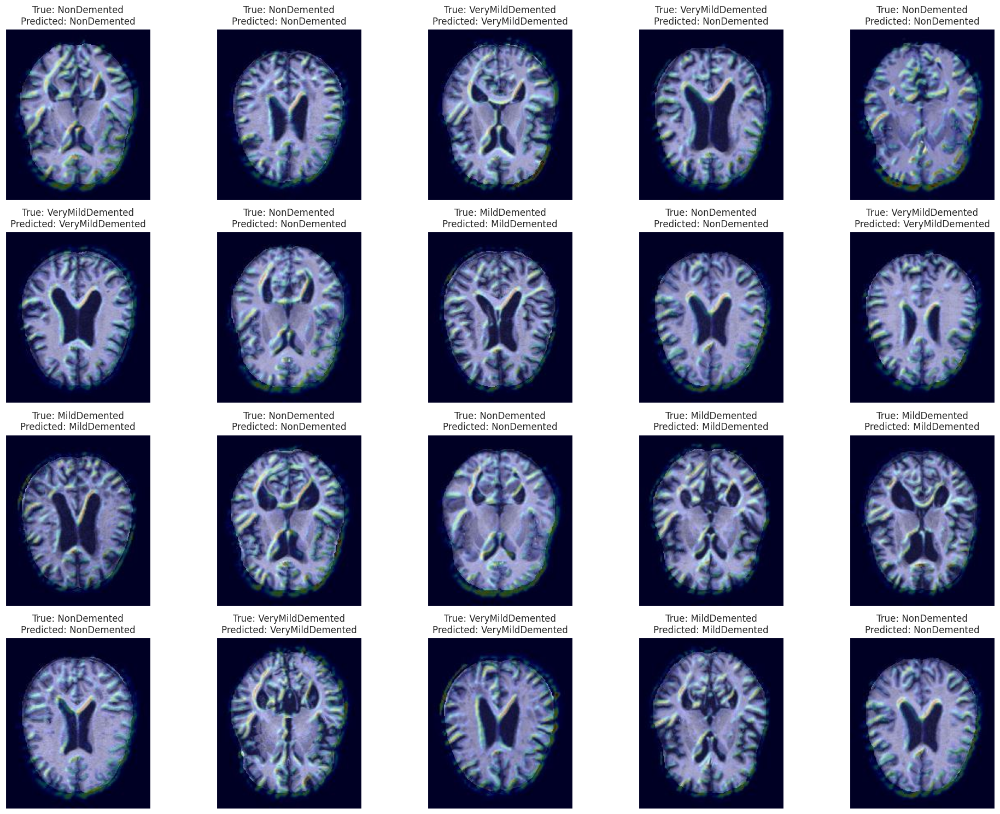

In [ ]:
# Display 20 pictures used by the neural network to classify the pictures with Grad-CAM
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(20, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

random_index = np.random.randint(0, len(test_df) - 1, 20)

for i, ax in enumerate(axes.flat):
    img_path = test_df.Filepath.iloc[random_index[i]]
    img_array = preprocess_input(get_img_array(img_path, size=img_size))

    # Generate the Grad-CAM heatmap
    heatmap = make_gradcam_heatmap(img_array, model, "conv2d_3")

    # Save the Grad-CAM overlay on the original image and display it
    cam_path = save_and_display_gradcam(img_path, heatmap)
    ax.imshow(plt.imread(cam_path))

    # Set the title with true and predicted labels
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}")

plt.tight_layout()
plt.show()

In [ ]:
import time

# Choose a random image from the test set
random_index = np.random.randint(0, len(test_df))
img_path = test_df.Filepath.iloc[random_index]

# Preprocess the image
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Time the inference
start_time = time.time()
prediction = model.predict(img_array)
end_time = time.time()

# Print the inference time
inference_time = end_time - start_time
print(f"Inference time: {inference_time:.4f} seconds")

1/1 [==============================] - 0s 102ms/step
Inference time: 0.4466 seconds


↘️ Visualize Confusion Matrix

In [ ]:
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(15, 7), text_size=10, norm=False, savefig=False):
  # Create the confustion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
    n_classes = cm.shape[0] # find the number of classes we're dealing with

    # Plot the figure and make it pretty
    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
    fig.colorbar(cax)

    # Are there a list of classes?
    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

    # Label the axes
    ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes),
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

    # Make x-axis labels appear on bottom
    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()
    ### Added: Rotate xticks for readability & increase font size (required due to such a large confusion matrix)
    plt.xticks(rotation=90, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    # Set the threshold for different colors
    threshold = (cm.max() + cm.min()) / 2.

    # Plot the text on each cell
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if norm:
            plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size)
        else:
            plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
    if savefig:
        fig.savefig("confusion_matrix.png")

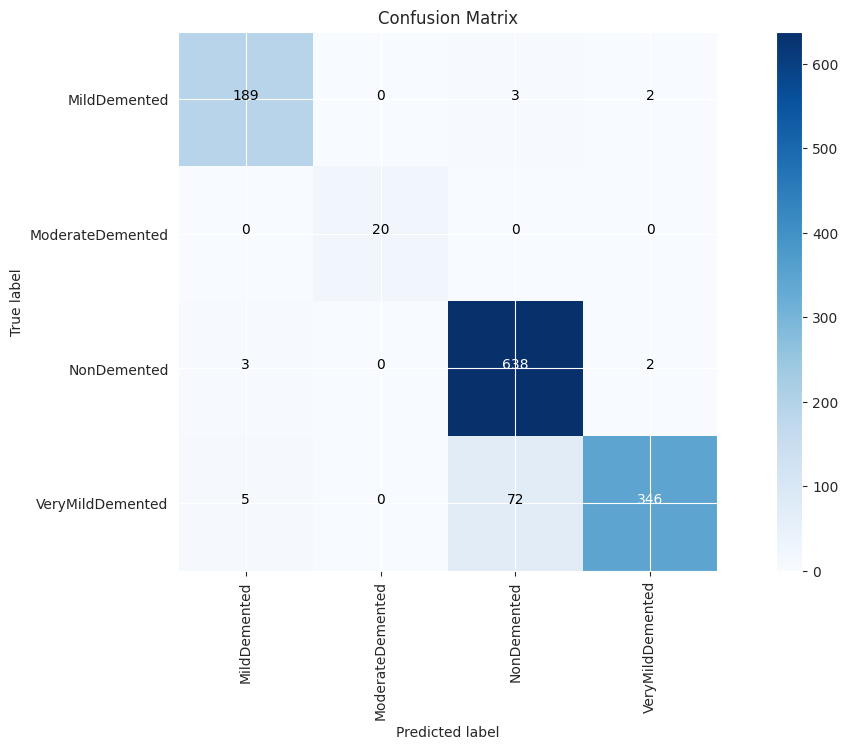

In [ ]:
make_confusion_matrix(y_test, pred, list(labels.values()))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2  (None, 110, 110, 10)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 10)        0         
 g2D)                                                   

/usr/local/lib/python3.10/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


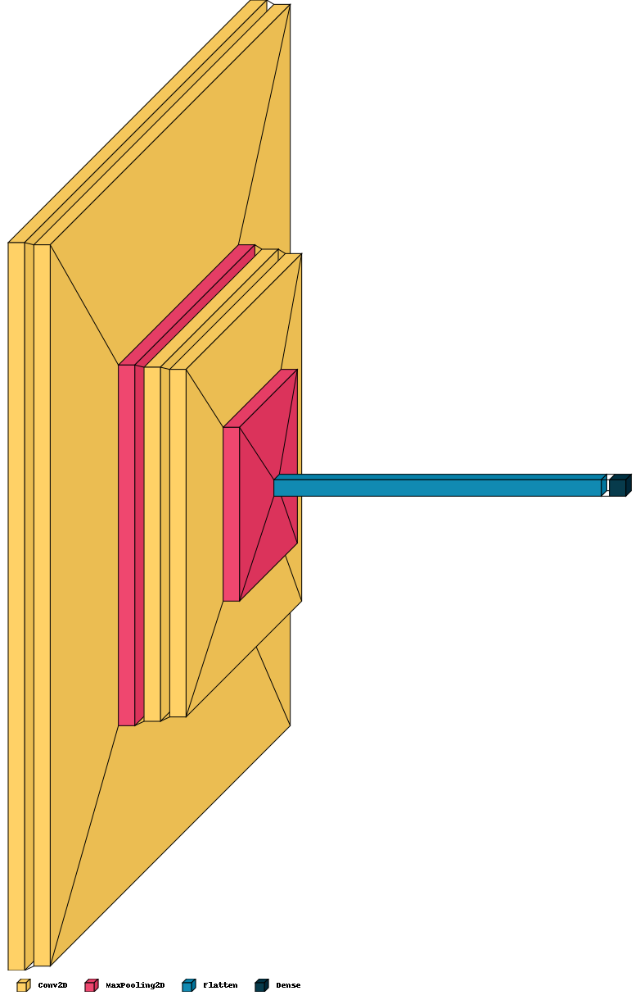

In [ ]:
# Model Pipeline Visualization

import visualkeras
visualkeras.layered_view(model, legend=True)

### Image Prediction

↘️ Make a prediction with CNN from scratch model using Alzheimer's scan image outside the dataset

1/1 [==============================] - 0s 56ms/step


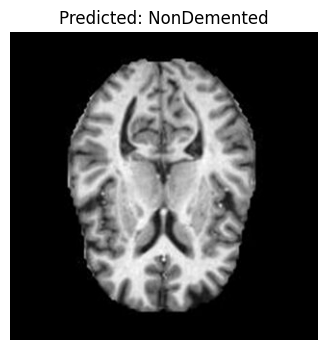

In [ ]:
image_path = '/content/non-demented.jpg'

# Preprocess the image
img_array = preprocess_input(get_img_array(image_path, size=img_size))
prediction = model.predict(img_array)
predicted_class_index = np.argmax(prediction)
predicted_label = labels[predicted_class_index]

# Set up the figure with a smaller size
plt.figure(figsize=(4, 4))  # Adjust the width and height as needed
plt.imshow(plt.imread(image_path), cmap='gray')
plt.title(f"Predicted: {predicted_label}", color='black')
plt.axis('off')
plt.show()

* Actual class: non demented
* Predicted: non demented ✅

1/1 [==============================] - 0s 34ms/step


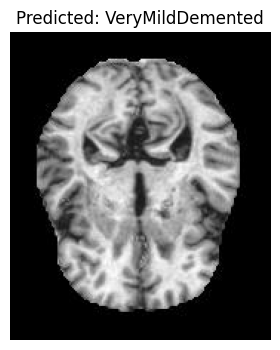

In [ ]:
image_path = '/content/mild-demented.jpg'

# Preprocess the image
img_array = preprocess_input(get_img_array(image_path, size=img_size))
prediction = model.predict(img_array)
predicted_class_index = np.argmax(prediction)
predicted_label = labels[predicted_class_index]

# Set up the figure with a smaller size
plt.figure(figsize=(4, 4))  # Adjust the width and height as needed
plt.imshow(plt.imread(image_path), cmap='gray')
plt.title(f"Predicted: {predicted_label}", color='black')
plt.axis('off')
plt.show()

* Actual class: mild demented
* Predicted: very mild demented ❎

1/1 [==============================] - 0s 119ms/step


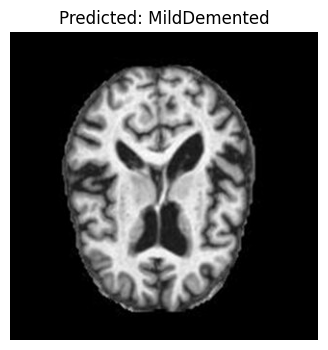

In [ ]:
image_path = '/content/mild-demented(2).jpg'

# Preprocess the image
img_array = preprocess_input(get_img_array(image_path, size=img_size))
prediction = model.predict(img_array)
predicted_class_index = np.argmax(prediction)
predicted_label = labels[predicted_class_index]

# Set up the figure with a smaller size
plt.figure(figsize=(4, 4))  # Adjust the width and height as needed
plt.imshow(plt.imread(image_path), cmap='gray')
plt.title(f"Predicted: {predicted_label}", color='black')
plt.axis('off')
plt.show()

* Actual class: mild demented
* Predicted: mild demented ✅

## ResNet50

In [ ]:
from tensorflow.keras.applications import EfficientNetB3, ResNet50

In [ ]:
# Load the pretained model
pretrained_model = tf.keras.applications.ResNet50(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='max'
)

pretrained_model.trainable = False

In [ ]:
# Create checkpoint callback
checkpoint_path = "animals_classification_model_checkpoint"
checkpoint_callback = ModelCheckpoint(checkpoint_path,
                                      save_weights_only=True,
                                      monitor="val_accuracy",
                                      save_best_only=True)

# Setup EarlyStopping callback to stop training if model's val_loss doesn't improve for 3 epochs
early_stopping = EarlyStopping(monitor = "val_loss", # watch the val loss metric
                               patience = 3,
                               restore_best_weights = True) # if val loss decreases for 3 epochs in a row, stop training

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.0001)

In [ ]:
inputs = pretrained_model.input

x = Dense(128, activation='relu')(pretrained_model.output)
x = BatchNormalization()(x)
x = Dropout(0.45)(x)
x = Dense(256, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.45)(x)


outputs = Dense(4, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer=Adam(0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    steps_per_epoch=len(train_images),
    validation_data=val_images,
    validation_steps=len(val_images),
    epochs=10,
    callbacks=[
        early_stopping,
        create_tensorboard_callback("training_logs",
                                    "classification"),
        checkpoint_callback,
        reduce_lr
    ]
)

Saving TensorBoard log files to: training_logs/classification/20240921-041824
Epoch 1/10
36/36 [==============================] - 627s 17s/step - loss: 1.8235 - accuracy: 0.3754 - val_loss: 1.4531 - val_accuracy: 0.4980 - lr: 0.0010
Epoch 2/10
36/36 [==============================] - 615s 17s/step - loss: 1.3780 - accuracy: 0.4722 - val_loss: 1.4292 - val_accuracy: 0.4961 - lr: 0.0010
Epoch 3/10
36/36 [==============================] - 623s 17s/step - loss: 1.1611 - accuracy: 0.5273 - val_loss: 1.1389 - val_accuracy: 0.5000 - lr: 0.0010
Epoch 4/10
36/36 [==============================] - 615s 17s/step - loss: 1.0439 - accuracy: 0.5744 - val_loss: 1.8164 - val_accuracy: 0.5078 - lr: 0.0010
Epoch 5/10
36/36 [==============================] - 613s 17s/step - loss: 0.9984 - accuracy: 0.5816 - val_loss: 1.0046 - val_accuracy: 0.5371 - lr: 0.0010
Epoch 6/10
36/36 [==============================] - 613s 17s/step - loss: 0.9042 - accuracy: 0.6152 - val_loss: 1.2031 - val_accuracy: 0.4238 - lr:

In [ ]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 1.05576
Test Accuracy: 54.69%


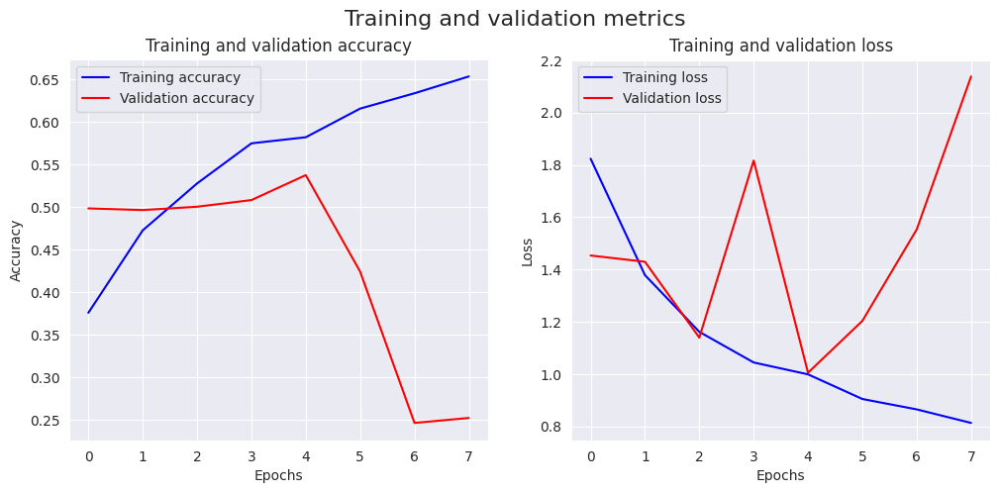

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

ax1.plot(epochs, accuracy, 'b', label='Training accuracy')
ax1.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
ax1.set_title('Training and validation accuracy')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.legend()

ax2.plot(epochs, loss, 'b', label='Training loss')
ax2.plot(epochs, val_loss, 'r', label='Validation loss')
ax2.set_title('Training and validation loss')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.legend()

fig.suptitle('Training and validation metrics', fontsize=16)
plt.show()

In [ ]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
#print(f'The first 5 predictions: {pred[:5]}')

10/10 [==============================] - 156s 15s/step


In [ ]:
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                  precision    recall  f1-score   support

    MildDemented       0.50      0.44      0.47       194
ModerateDemented       0.00      0.00      0.00        20
     NonDemented       0.55      0.93      0.69       643
VeryMildDemented       0.65      0.04      0.07       423

        accuracy                           0.55      1280
       macro avg       0.43      0.35      0.31      1280
    weighted avg       0.57      0.55      0.44      1280



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,precision,recall,f1-score,support
MildDemented,0.497110,0.443299,0.468665,194.000000
ModerateDemented,0.000000,0.000000,0.000000,20.000000
NonDemented,0.552583,0.931571,0.693688,643.000000
VeryMildDemented,0.652174,0.035461,0.067265,423.000000
accuracy,0.546875,0.546875,0.546875,0.546875
macro avg,0.425467,0.352583,0.307404,1280.000000
weighted avg,0.568453,0.546875,0.441731,1280.000000


↘️ Make prediction from test dataset

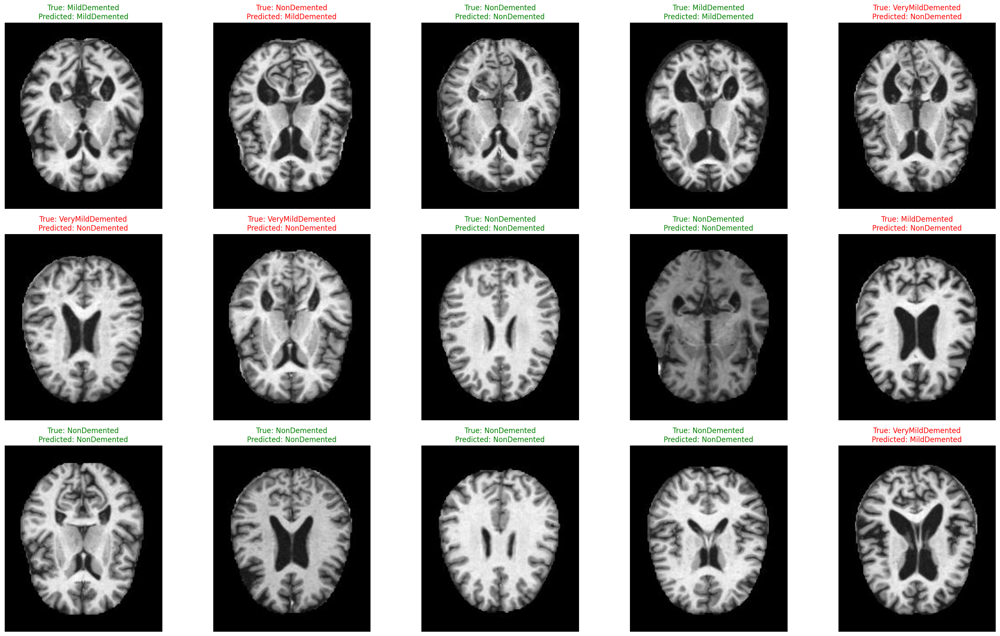

In [ ]:
# Display 25 random pictures from the dataset in greyscale with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                         subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]), cmap='gray')
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)

plt.tight_layout()
plt.show()


↘️ Visualize Confusion Matrix

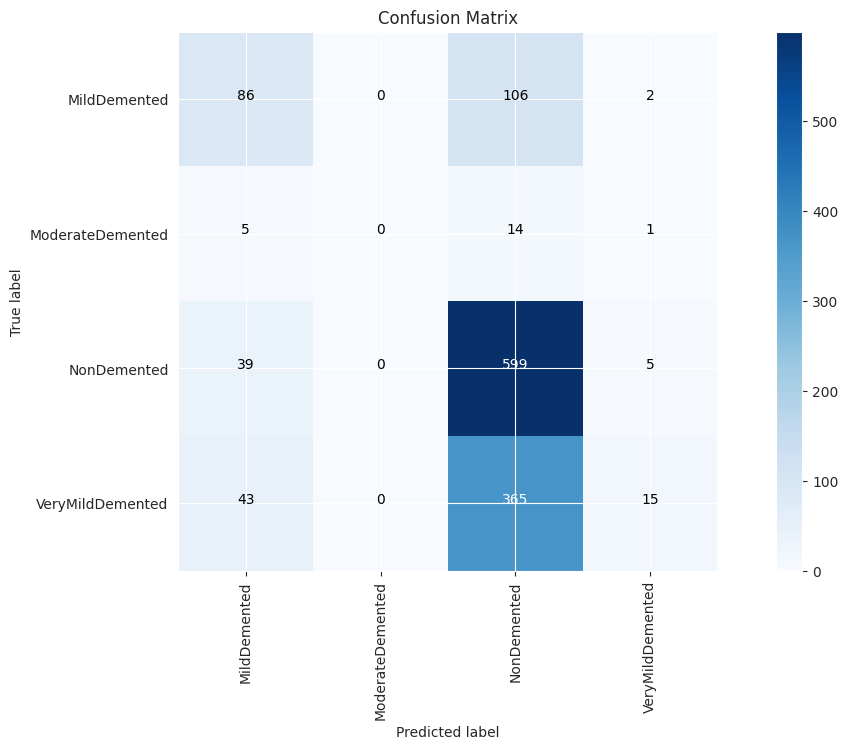

In [ ]:
make_confusion_matrix(y_test, pred, list(labels.values()))

## EfficientNetB7

In [ ]:
# Load the pretained model
pretrained_model = tf.keras.applications.efficientnet.EfficientNetB7(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='max'
)

pretrained_model.trainable = False

258076736/258076736 [==============================] - 1s 0us/step


In [ ]:
# Create checkpoint callback
checkpoint_path = "animals_classification_model_checkpoint"
checkpoint_callback = ModelCheckpoint(checkpoint_path,
                                      save_weights_only=True,
                                      monitor="val_accuracy",
                                      save_best_only=True)

# Setup EarlyStopping callback to stop training if model's val_loss doesn't improve for 3 epochs
early_stopping = EarlyStopping(monitor = "val_loss", # watch the val loss metric
                               patience = 3,
                               restore_best_weights = True) # if val loss decreases for 3 epochs in a row, stop training

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.0001)

In [ ]:
inputs = pretrained_model.input

x = Dense(128, activation='relu')(pretrained_model.output)
x = BatchNormalization()(x)
x = Dropout(0.45)(x)
x = Dense(256, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.45)(x)


outputs = Dense(4, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer=Adam(0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    steps_per_epoch=len(train_images),
    validation_data=val_images,
    validation_steps=len(val_images),
    epochs=10,
    callbacks=[
        early_stopping,
        create_tensorboard_callback("training_logs",
                                    "classification"),
        checkpoint_callback,
        reduce_lr
    ]
)

Saving TensorBoard log files to: training_logs/classification/20240921-080636
Epoch 1/10
36/36 [==============================] - 395s 10s/step - loss: 1.9051 - accuracy: 0.3058 - val_loss: 2.2265 - val_accuracy: 0.1387 - lr: 0.0010
Epoch 2/10
36/36 [==============================] - 366s 10s/step - loss: 1.5791 - accuracy: 0.3622 - val_loss: 1.7471 - val_accuracy: 0.1387 - lr: 0.0010
Epoch 3/10
36/36 [==============================] - 371s 10s/step - loss: 1.4418 - accuracy: 0.3945 - val_loss: 1.0826 - val_accuracy: 0.4961 - lr: 0.0010
Epoch 4/10
36/36 [==============================] - 367s 10s/step - loss: 1.3405 - accuracy: 0.4206 - val_loss: 1.0623 - val_accuracy: 0.3574 - lr: 0.0010
Epoch 5/10
36/36 [==============================] - 369s 10s/step - loss: 1.2718 - accuracy: 0.4258 - val_loss: 1.0759 - val_accuracy: 0.4961 - lr: 0.0010
Epoch 6/10
36/36 [==============================] - 372s 10s/step - loss: 1.2292 - accuracy: 0.4440 - val_loss: 1.0914 - val_accuracy: 0.4961 - lr:

In [ ]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 1.06611
Test Accuracy: 50.23%


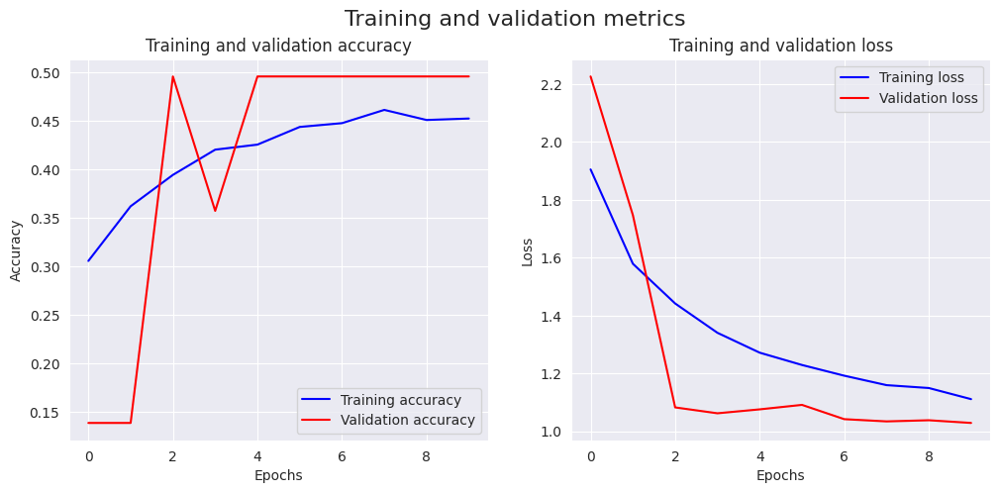

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

ax1.plot(epochs, accuracy, 'b', label='Training accuracy')
ax1.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
ax1.set_title('Training and validation accuracy')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.legend()

ax2.plot(epochs, loss, 'b', label='Training loss')
ax2.plot(epochs, val_loss, 'r', label='Validation loss')
ax2.set_title('Training and validation loss')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.legend()

fig.suptitle('Training and validation metrics', fontsize=16)
plt.show()

In [ ]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

10/10 [==============================] - 98s 9s/step
The first 5 predictions: ['NonDemented', 'NonDemented', 'NonDemented', 'NonDemented', 'NonDemented']


In [ ]:
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                  precision    recall  f1-score   support

    MildDemented       0.00      0.00      0.00       194
ModerateDemented       0.00      0.00      0.00        20
     NonDemented       0.50      1.00      0.67       643
VeryMildDemented       0.00      0.00      0.00       423

        accuracy                           0.50      1280
       macro avg       0.13      0.25      0.17      1280
    weighted avg       0.25      0.50      0.34      1280



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,precision,recall,f1-score,support
MildDemented,0.000000,0.000000,0.000000,194.000000
ModerateDemented,0.000000,0.000000,0.000000,20.000000
NonDemented,0.502344,1.000000,0.668747,643.000000
VeryMildDemented,0.000000,0.000000,0.000000,423.000000
accuracy,0.502344,0.502344,0.502344,0.502344
macro avg,0.125586,0.250000,0.167187,1280.000000
weighted avg,0.252349,0.502344,0.335941,1280.000000


↘️ Make prediction from test dataset

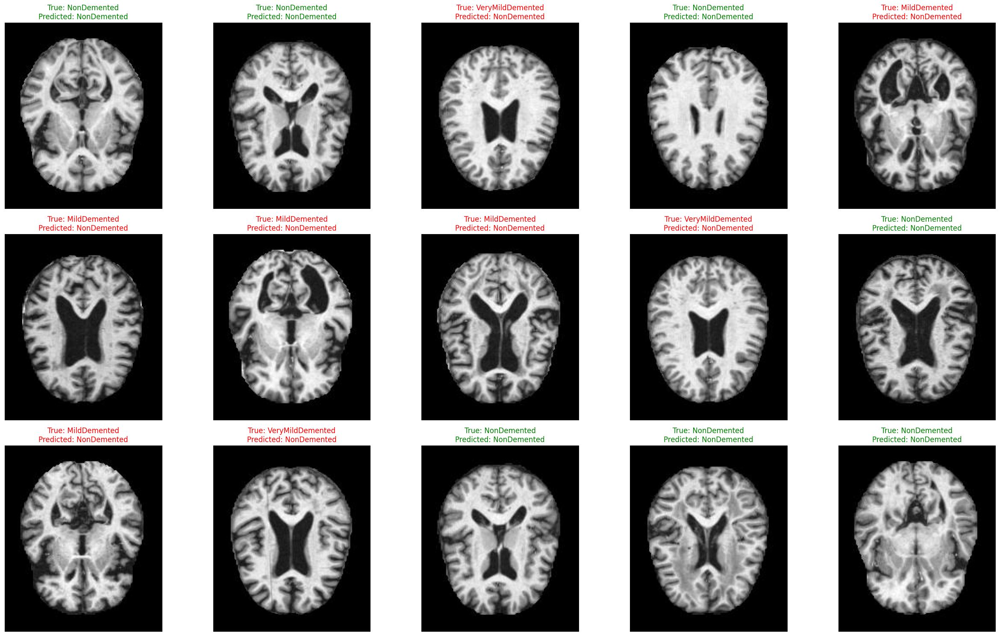

In [ ]:
# Display 25 random pictures from the dataset in greyscale with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                         subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]), cmap='gray')
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)

plt.tight_layout()
plt.show()

↘️ Grad-CAM Visualization

<ipython-input-39-816fc6d99159>:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


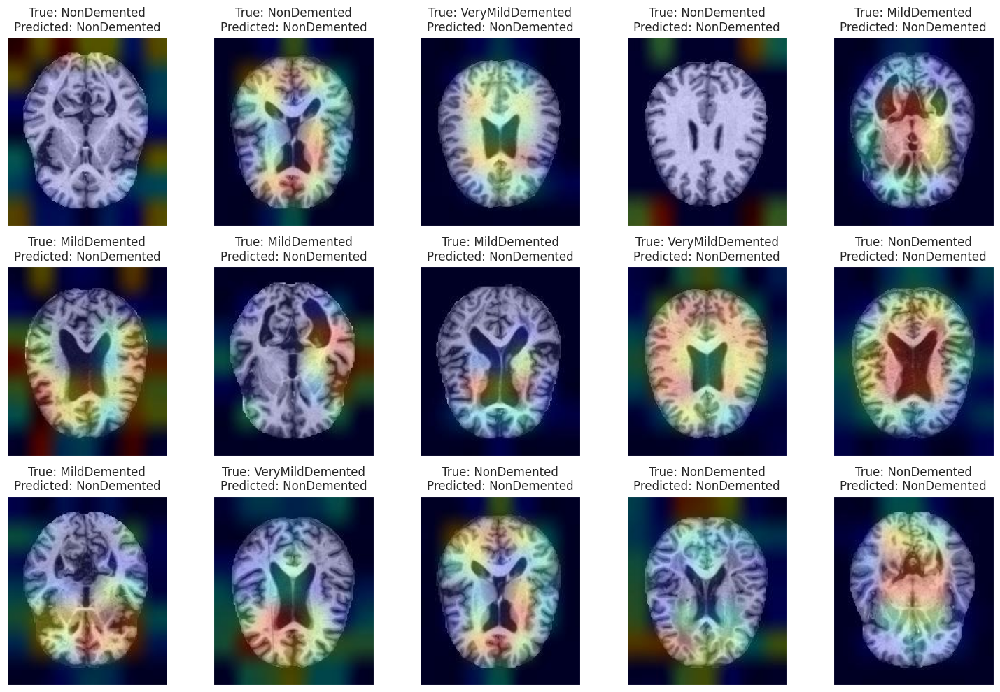

In [ ]:
# Display the part of the pictures used by the neural network to classify the pictures
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    img_path = test_df.Filepath.iloc[random_index[i]]
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    cam_path = save_and_display_gradcam(img_path, heatmap)
    ax.imshow(plt.imread(cam_path))
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}")
plt.tight_layout()
plt.show()

↘️ Visualize Confusion Matrix

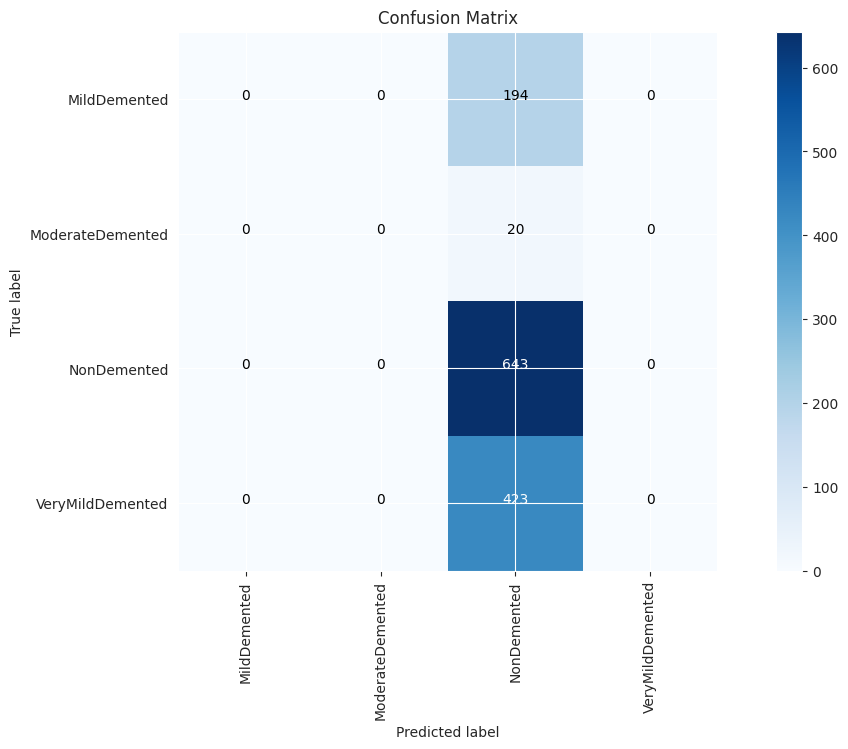

In [ ]:
make_confusion_matrix(y_test, pred, list(labels.values()))

In [ ]:
import time

# Choose a random image from the test set
random_index = np.random.randint(0, len(test_df))
img_path = test_df.Filepath.iloc[random_index]

# Preprocess the image
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Time the inference
start_time = time.time()
prediction = model.predict(img_array)
end_time = time.time()

# Print the inference time
inference_time = end_time - start_time
print(f"Inference time: {inference_time:.4f} seconds")

1/1 [==============================] - 5s 5s/step
Inference time: 4.7649 seconds


In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_1[0][0]']             
                                                                                                  
 normalization (Normalizati  (None, 224, 224, 3)          7         ['rescaling[0][0]']           
 on)                                                                                              
                                                                                                  
 rescaling_1 (Rescaling)     (None, 224, 224, 3)          0         ['normalization[0][0]']   

In [ ]:
import visualkeras
visualkeras.layered_view(model, legend=True)

↘️ Results

**1. CNN from scratch accuracy**
* training: 0.9891
* validation: 0.9492
* testing: 0.9320

**2. ResNet50**
* training: 0.6530
* validation: 0.2520
* testing: 0.5468

**3. EfifcientNetB7**
* training: 0.4527
* validation: 0.4961
* testing: 0.5023

↘️ Conclusion

* CNN from scratch more recommended for its strong performance and fast inference time, without overfitting issues, making it efficient for real-time application scenarios.
* From the results, smaller batch size and learning rate during hyperparameter tuning helps the CNN model built from scratch achieve better convergence.
* Pretrained models struggle with unbalanced datasets, frequently relied with majority classes. Fine-tuning epochs, learning rates, and model architecture, along with longer training, can improve performance and address underfitting.

# Hyperparameter Tuning for CNN from Scratch

## Batch Size = 128, Learning Rate = 0.005

In [ ]:
# Create the model
model = Sequential([
    Conv2D(10, 3, activation='relu', input_shape=(224, 224, 3)),
    Conv2D(10, 3, activation='relu'),
    MaxPool2D(),
    Conv2D(10, 3, activation='relu'),
    Conv2D(10, 3, activation='relu'),
    MaxPool2D(),
    Flatten(),
    Dense(4, activation='softmax')  # Adjusted to 4 classes
])

# Compile the model
model.compile(
    loss="categorical_crossentropy",
    optimizer=tf.keras.optimizers.Adam(0.005),
    metrics=["accuracy"]
)

# Setup EarlyStopping callback
early_stopping = EarlyStopping(
    monitor="val_loss",              # Watch the validation loss
    patience=3,                      # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True        # Restore the weights of the best epoch
)

# Fit the model
history = model.fit(
    train_images,
    epochs=10,
    batch_size=BATCH_SIZE,
    validation_data=val_images,
    steps_per_epoch=len(train_images),
    validation_steps=len(val_images),
    callbacks=[early_stopping]  # Include the EarlyStopping callback
)

Epoch 1/10
36/36 [==============================] - 177s 5s/step - loss: 1.0074 - accuracy: 0.5321 - val_loss: 0.8282 - val_accuracy: 0.6309
Epoch 2/10
36/36 [==============================] - 175s 5s/step - loss: 0.6731 - accuracy: 0.7140 - val_loss: 0.5118 - val_accuracy: 0.7891
Epoch 3/10
36/36 [==============================] - 175s 5s/step - loss: 0.3553 - accuracy: 0.8650 - val_loss: 0.2931 - val_accuracy: 0.8945
Epoch 4/10
36/36 [==============================] - 175s 5s/step - loss: 0.1871 - accuracy: 0.9327 - val_loss: 0.1956 - val_accuracy: 0.9297
Epoch 5/10
36/36 [==============================] - 172s 5s/step - loss: 0.0675 - accuracy: 0.9772 - val_loss: 0.1610 - val_accuracy: 0.9355
Epoch 6/10
36/36 [==============================] - 172s 5s/step - loss: 0.0192 - accuracy: 0.9944 - val_loss: 0.1372 - val_accuracy: 0.9609
Epoch 7/10
36/36 [==============================] - 171s 5s/step - loss: 0.0119 - accuracy: 0.9972 - val_loss: 0.1450 - val_accuracy: 0.9629
Epoch 8/10
36

In [ ]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.13510
Test Accuracy: 95.63%


In [ ]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
#print(f'The first 5 predictions: {pred[:5]}')

10/10 [==============================] - 22s 2s/step


In [ ]:
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                  precision    recall  f1-score   support

    MildDemented       0.98      0.97      0.98       194
ModerateDemented       1.00      1.00      1.00        20
     NonDemented       0.95      0.97      0.96       643
VeryMildDemented       0.95      0.92      0.94       423

        accuracy                           0.96      1280
       macro avg       0.97      0.97      0.97      1280
    weighted avg       0.96      0.96      0.96      1280



In [ ]:
report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

,precision,recall,f1-score,support
MildDemented,0.979275,0.974227,0.976744,194.00000
ModerateDemented,1.000000,1.000000,1.000000,20.00000
NonDemented,0.949848,0.972006,0.960799,643.00000
VeryMildDemented,0.953545,0.921986,0.937500,423.00000
accuracy,0.956250,0.956250,0.956250,0.95625
macro avg,0.970667,0.967055,0.968761,1280.00000
weighted avg,0.956313,0.956250,0.956129,1280.00000


In [ ]:
import time

# Choose a random image from the test set
random_index = np.random.randint(0, len(test_df))
img_path = test_df.Filepath.iloc[random_index]

# Preprocess the image
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Time the inference
start_time = time.time()
prediction = model.predict(img_array)
end_time = time.time()

# Print the inference time
inference_time = end_time - start_time
print(f"Inference time: {inference_time:.4f} seconds")

1/1 [==============================] - 0s 93ms/step
Inference time: 0.1513 seconds


## Batch Size = 64, Learning Rate = 0.001

⤵️ First we need to set the batch size to 64

In [ ]:
# Define constants
BATCH_SIZE = 64 # set batch size
TARGET_SIZE = (224, 224)

# Create data generators
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    subset='training'
)

val_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    subset='validation'
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 4608 validated image filenames belonging to 4 classes.
Found 512 validated image filenames belonging to 4 classes.
Found 1280 validated image filenames belonging to 4 classes.


In [ ]:
# Create the model
model = Sequential([
    Conv2D(10, 3, activation='relu', input_shape=(224, 224, 3)),
    Conv2D(10, 3, activation='relu'),
    MaxPool2D(),
    Conv2D(10, 3, activation='relu'),
    Conv2D(10, 3, activation='relu'),
    MaxPool2D(),
    Flatten(),
    Dense(4, activation='softmax')  # Adjusted to 4 classes
])

# Compile the model
model.compile(
    loss="categorical_crossentropy",
    optimizer=tf.keras.optimizers.Adam(0.001),
    metrics=["accuracy"]
)

# Setup EarlyStopping callback
early_stopping = EarlyStopping(
    monitor="val_loss",              # Watch the validation loss
    patience=3,                      # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True        # Restore the weights of the best epoch
)

# Fit the model
history = model.fit(
    train_images,
    epochs=10,
    batch_size=BATCH_SIZE,
    validation_data=val_images,
    steps_per_epoch=len(train_images),
    validation_steps=len(val_images),
    callbacks=[early_stopping]  # Include the EarlyStopping callback
)

Epoch 1/10
72/72 [==============================] - 190s 3s/step - loss: 0.9692 - accuracy: 0.5373 - val_loss: 0.8472 - val_accuracy: 0.5938
Epoch 2/10
72/72 [==============================] - 180s 3s/step - loss: 0.6987 - accuracy: 0.6931 - val_loss: 0.5523 - val_accuracy: 0.7539
Epoch 3/10
72/72 [==============================] - 179s 2s/step - loss: 0.3955 - accuracy: 0.8533 - val_loss: 0.3316 - val_accuracy: 0.8750
Epoch 4/10
72/72 [==============================] - 179s 2s/step - loss: 0.2002 - accuracy: 0.9342 - val_loss: 0.2916 - val_accuracy: 0.8652
Epoch 5/10
72/72 [==============================] - 177s 2s/step - loss: 0.1222 - accuracy: 0.9599 - val_loss: 0.1724 - val_accuracy: 0.9434
Epoch 6/10
72/72 [==============================] - 181s 3s/step - loss: 0.0419 - accuracy: 0.9913 - val_loss: 0.1001 - val_accuracy: 0.9570
Epoch 7/10
72/72 [==============================] - 181s 3s/step - loss: 0.0202 - accuracy: 0.9967 - val_loss: 0.0716 - val_accuracy: 0.9785
Epoch 8/10
72

In [ ]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.08808
Test Accuracy: 97.34%


In [ ]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
#print(f'The first 5 predictions: {pred[:5]}')

20/20 [==============================] - 23s 1s/step


In [ ]:
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                  precision    recall  f1-score   support

    MildDemented       0.96      0.98      0.97       194
ModerateDemented       1.00      1.00      1.00        20
     NonDemented       0.97      0.99      0.98       643
VeryMildDemented       0.99      0.95      0.97       423

        accuracy                           0.97      1280
       macro avg       0.98      0.98      0.98      1280
    weighted avg       0.97      0.97      0.97      1280



In [ ]:
report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

,precision,recall,f1-score,support
MildDemented,0.959799,0.984536,0.972010,194.000000
ModerateDemented,1.000000,1.000000,1.000000,20.000000
NonDemented,0.966514,0.987558,0.976923,643.000000
VeryMildDemented,0.990099,0.945626,0.967352,423.000000
accuracy,0.973437,0.973437,0.973437,0.973437
macro avg,0.979103,0.979430,0.979071,1280.000000
weighted avg,0.973814,0.973437,0.973376,1280.000000


In [ ]:
import time

# Choose a random image from the test set
random_index = np.random.randint(0, len(test_df))
img_path = test_df.Filepath.iloc[random_index]

# Preprocess the image
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Time the inference
start_time = time.time()
prediction = model.predict(img_array)
end_time = time.time()

# Print the inference time
inference_time = end_time - start_time
print(f"Inference time: {inference_time:.4f} seconds")

1/1 [==============================] - 0s 90ms/step
Inference time: 0.1429 seconds


## Batch Size = 64, Learning Rate = 0.005

In [ ]:
# Create the model
model = Sequential([
    Conv2D(10, 3, activation='relu', input_shape=(224, 224, 3)),
    Conv2D(10, 3, activation='relu'),
    MaxPool2D(),
    Conv2D(10, 3, activation='relu'),
    Conv2D(10, 3, activation='relu'),
    MaxPool2D(),
    Flatten(),
    Dense(4, activation='softmax')  # Adjusted to 4 classes
])

# Compile the model
model.compile(
    loss="categorical_crossentropy",
    optimizer=tf.keras.optimizers.Adam(0.005),
    metrics=["accuracy"]
)

# Setup EarlyStopping callback
early_stopping = EarlyStopping(
    monitor="val_loss",              # Watch the validation loss
    patience=3,                      # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True        # Restore the weights of the best epoch
)

# Fit the model
history = model.fit(
    train_images,
    epochs=10,
    batch_size=BATCH_SIZE,
    validation_data=val_images,
    steps_per_epoch=len(train_images),
    validation_steps=len(val_images),
    callbacks=[early_stopping]  # Include the EarlyStopping callback
)

Epoch 1/10
72/72 [==============================] - 181s 3s/step - loss: 1.3113 - accuracy: 0.5050 - val_loss: 0.9436 - val_accuracy: 0.5254
Epoch 2/10
72/72 [==============================] - 179s 2s/step - loss: 0.8734 - accuracy: 0.5972 - val_loss: 0.7665 - val_accuracy: 0.6426
Epoch 3/10
72/72 [==============================] - 177s 2s/step - loss: 0.6417 - accuracy: 0.7201 - val_loss: 0.6018 - val_accuracy: 0.7520
Epoch 4/10
72/72 [==============================] - 178s 2s/step - loss: 0.4303 - accuracy: 0.8216 - val_loss: 0.3795 - val_accuracy: 0.8516
Epoch 5/10
72/72 [==============================] - 177s 2s/step - loss: 0.3417 - accuracy: 0.8579 - val_loss: 0.3553 - val_accuracy: 0.8535
Epoch 6/10
72/72 [==============================] - 177s 2s/step - loss: 0.2560 - accuracy: 0.8982 - val_loss: 0.2923 - val_accuracy: 0.8984
Epoch 7/10
72/72 [==============================] - 179s 2s/step - loss: 0.1659 - accuracy: 0.9371 - val_loss: 0.2203 - val_accuracy: 0.9180
Epoch 8/10
72

In [ ]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.23110
Test Accuracy: 93.75%


In [ ]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
#print(f'The first 5 predictions: {pred[:5]}')

20/20 [==============================] - 23s 1s/step


In [ ]:
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                  precision    recall  f1-score   support

    MildDemented       0.96      0.92      0.94       194
ModerateDemented       1.00      0.95      0.97        20
     NonDemented       0.92      0.98      0.95       643
VeryMildDemented       0.96      0.88      0.92       423

        accuracy                           0.94      1280
       macro avg       0.96      0.93      0.94      1280
    weighted avg       0.94      0.94      0.94      1280



In [ ]:
report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

,precision,recall,f1-score,support
MildDemented,0.957219,0.922680,0.939633,194.0000
ModerateDemented,1.000000,0.950000,0.974359,20.0000
NonDemented,0.917151,0.981337,0.948159,643.0000
VeryMildDemented,0.961140,0.877069,0.917182,423.0000
accuracy,0.937500,0.937500,0.937500,0.9375
macro avg,0.958878,0.932772,0.944833,1280.0000
weighted avg,0.939055,0.937500,0.937039,1280.0000


In [ ]:
import time

# Choose a random image from the test set
random_index = np.random.randint(0, len(test_df))
img_path = test_df.Filepath.iloc[random_index]

# Preprocess the image
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Time the inference
start_time = time.time()
prediction = model.predict(img_array)
end_time = time.time()

# Print the inference time
inference_time = end_time - start_time
print(f"Inference time: {inference_time:.4f} seconds")

1/1 [==============================] - 0s 87ms/step
Inference time: 0.1346 seconds


↘️ Results of hyperparameter tuning for CNN from scratch accuracy

**1. Batch Size = 128, Learning Rate = 0.001**
* training: 0.9891
* validation: 0.9492
* testing: 0.9320
* Inference Time (s): 0.4466

**2. Batch Size = 128, Learning Rate = 0.005**
* training: 0.9920
* validation: 0.9551
* testing: 0.9562
* Inference Time (s): 0.1513

**3. Batch Size = 64, Learning Rate = 0.001**
* training: 0.9972
* validation: 0.9844
* testing: 0.9734
* Inference Time (s): 0.1429

**4. Batch Size = 64, Learning Rate = 0.005**
* training: 0.9861
* validation: 0.9316
* testing: 0.9375
* Inference Time (s): 0.1346


↘️ Conclusion

The best result is achieved with Batch Size = 64 and Learning Rate = 0.001, providing the highest validation (0.9844) and testing accuracy (0.9734) along with fast inference time (0.1429s), indicating that smaller batch sizes with moderate learning rates yield better model performance.